# Lab 03: Exploring CFIR Image Data

Erik Gabrielsen, Danh Nguyen

## Business Understanding 

Human beings are very adept at recognizing objects and patterns in images, but the same cannot be said about computers. As we push forward in the field of computer vision, the [CFIR-10](https://www.kaggle.com/c/cifar-10) dataset was used in a Kaggle competition to programatically recognize objects in images. The dataset consists of 50,000 training images with the following labels: 

* airplane 
* automobile 
* bird 
* cat 
* deer 
* dog 
* frog 
* horse 
* ship 
* truck

The images are 32x32, colored with the subject mostly centered in the middle of the image. Their subjects are various types, shapes, and orientations. For instance, birds and cats can be of different species and sizes, and images of truck can be taken head on, from behind, or from the side. The dataset also contains 10,000 test images to classify for the competition, as well as 290,000 "junk" images that are not scored.  

In the first lab, we will explore certain component analysis and feature extraction to see if there are common differences among the classes. The ultimate goal is to programmatically determine what type of object appears in an image. We hope to achieve above 50% accuracy on our training and testing sets one day. In the interest of runtime, we will look at the 5,000 images of the training set. In these first images, the distribution of images per label is pretty even at around 500 images each.  


In [1]:
import pandas as pd
import numpy as np
import os
from scipy.misc import imread
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import random
import warnings
import seaborn as sns

%matplotlib inline



In [2]:
directory = os.path.expanduser('~/Downloads/train/')
images = []
files = []

# loop over directories: 
for i in range(1, 50001):
    name = str(i) + '.png'
    file = os.path.join(directory, name)
    images.append(mpimg.imread(file))

In [3]:
# Read in label
df = pd.read_csv('~/Downloads/trainLabels.csv') # read in the csv file
labels = df.label.values

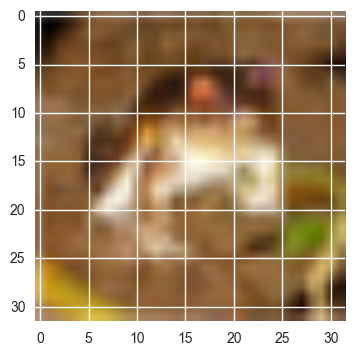

In [4]:
imgplot = plt.imshow(images[0])

## Data Preparation 

The images are initially stored as 3 separate matrices for Red, Green, and Blue values. We converted these 3 matrices into 1 grayscale image according to the luminance formula: `0.299*R + 0.587*G, 0.114*B`. Examples of the grayscale images are displayed below. 

In [5]:
# convert to luminance, thanks http://stackoverflow.com/questions/12201577/how-can-i-convert-an-rgb-image-into-grayscale-in-python

def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.299, 0.587, 0.114])

for i in range(0, len(images)):
    images[i] = rgb2gray(images[i])

In [6]:
# a helper plotting function
def plot_gallery(images, titles, h, w, n_row=3, n_col=6):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(1.7 * n_col, 2.3 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[i].reshape((h, w)), cmap=plt.cm.gray)
        plt.title(titles[i], size=12)
        plt.xticks(())
        plt.yticks(())


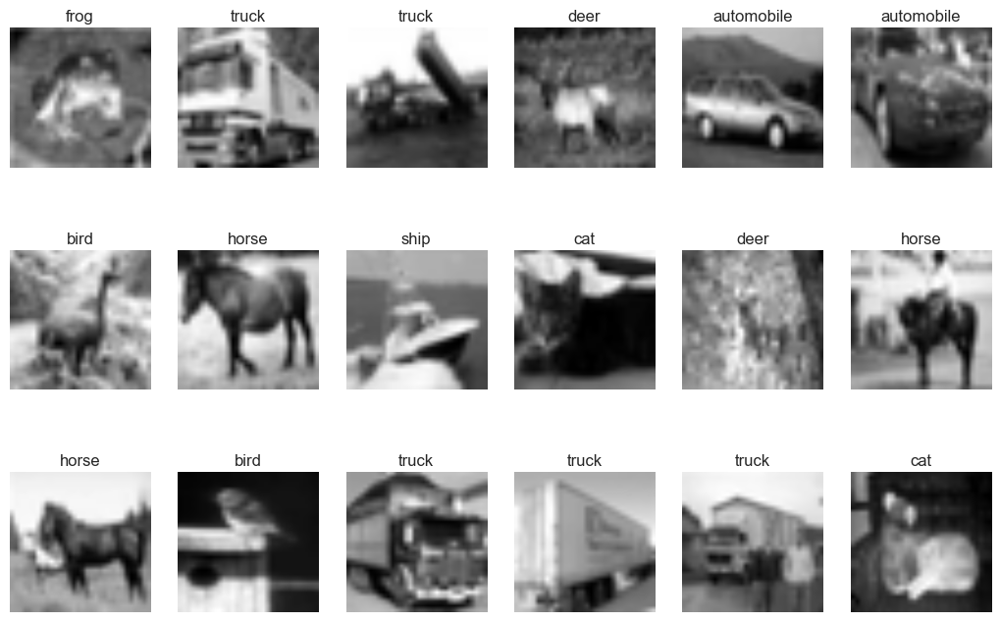

In [7]:
plot_gallery(images, labels, 32, 32) # defaults to showing a 3 by 6 subset of the faces

In [8]:
# Linearization
img_concat = []
for image in images: 
    img_concat.append(np.concatenate(image))

In [9]:
# img_concat_arr = np.array(img_concat)
print(len(img_concat))
print(np.array(img_concat[0:50000]).shape)

50000
(50000, 1024)


We then concatenate each image matrix to represent it as one linear array of image features. As previously stated, we are looking at only 5,000 images in order to save time running analysis and feature extraction algorithms. 

In [10]:
# get some of the specifics of the dataset
# y = lfw_people.target
X = np.array(img_concat[0:5000]) 
names = labels[0:5000]

n_samples, n_features = X.shape
h, w = 32, 32
n_classes = len(names)

print("n_samples: {}".format(n_samples))
print("n_features: {}".format(n_features))
print("n_classes: {}".format(n_classes))
print("Original Image Sizes {}by{}".format(h,w))
print (125*94) # the size of the images are the size of the feature vectors

n_samples: 5000
n_features: 1024
n_classes: 5000
Original Image Sizes 32by32
11750


## Full PCA

We first performed a linear dimensionality reduction on the images, using full principal component analysis. We plot the number of principal components versus the cumulative explained variance by those components, and found that in order to explain about 90% of the variance, we need around 73 dimensions.

In [11]:
from sklearn.decomposition import PCA

n_components = 300
print ("Extracting the top %d eigenobjects from %d objects" % (
    n_components, X.shape[0]))

pca = PCA(n_components=n_components)
%time pca.fit(X)
eigenfaces = pca.components_.reshape((n_components, h, w))

Extracting the top 300 eigenobjects from 5000 objects
CPU times: user 2.36 s, sys: 90 ms, total: 2.45 s
Wall time: 1.31 s


In [12]:
def plot_explained_variance(pca):
    import plotly
    from plotly.graph_objs import Scatter, Marker, Layout, XAxis, YAxis, Bar, Line
    plotly.offline.init_notebook_mode() # run at the start of every notebook
    
    explained_var = pca.explained_variance_ratio_
    cum_var_exp = np.cumsum(explained_var)
    
    plotly.offline.iplot({
        "data": [Bar(y=explained_var, name='individual explained variance'),
                 Scatter(y=cum_var_exp, name='cumulative explained variance')
            ],
        "layout": Layout(xaxis=XAxis(title='Principal components'), yaxis=YAxis(title='Explained variance ratio'))
    })

![Full PCA](https://raw.githubusercontent.com/egabrielsen/MachineLearning/master/Lab03/Screen%20Shot%202017-02-17%20at%208.14.17%20PM.png)

In [13]:
plot_explained_variance(pca)

Unfortunately, we cannot tell much from the eigenvalues extracted from each image. However, a reconstruction of an automobile shows a very close representation of the original image. 

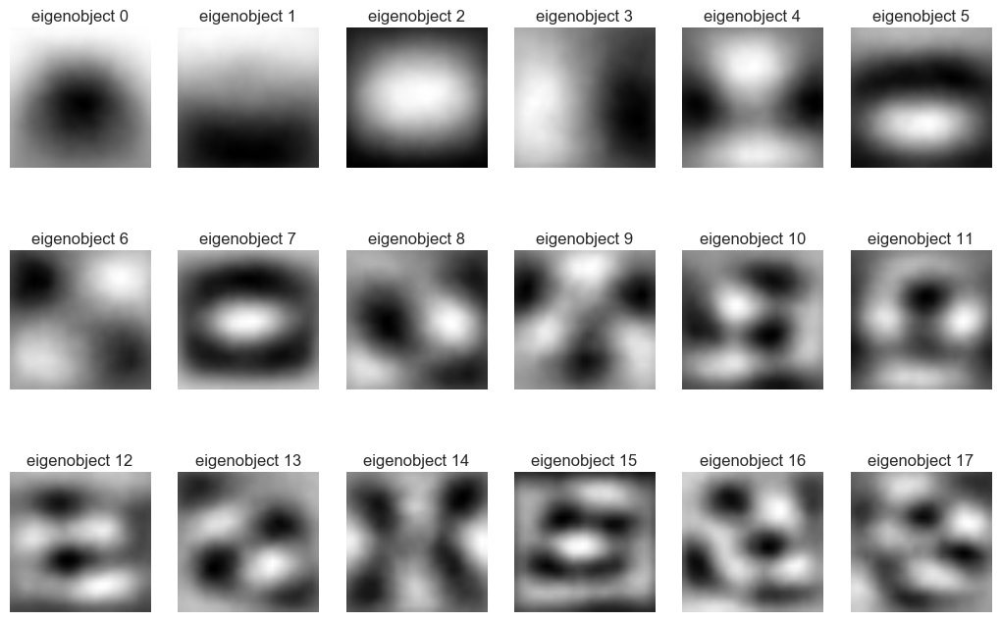

In [14]:
eigen_titles = ["eigenobject %d" % i for i in range(eigenfaces.shape[0])]
plot_gallery(eigenfaces, eigen_titles, h, w)

In [15]:
def reconstruct_image(trans_obj,org_features):
    low_rep = trans_obj.transform(org_features)
    rec_image = trans_obj.inverse_transform(low_rep)
    return low_rep, rec_image

/Users/danh/anaconda/envs/machinelearning/lib/python3.5/site-packages/sklearn/utils/validation.py:386: DeprecationWarning:

Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.



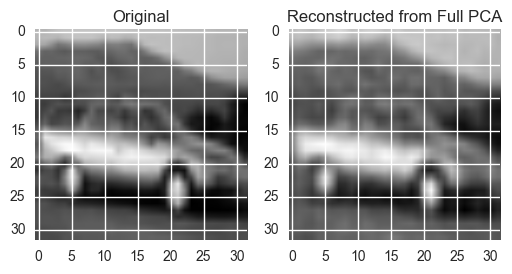

In [16]:
idx_to_reconstruct = 4    
low_dimensional_representation, reconstructed_image = reconstruct_image(pca,X[idx_to_reconstruct])

plt.subplot(1,2,1)
plt.imshow(X[4].reshape((h, w)), cmap=plt.cm.gray)
plt.title('Original')
plt.subplot(1,2,2)
plt.imshow(reconstructed_image.reshape((h, w)), cmap=plt.cm.gray)
plt.title('Reconstructed from Full PCA')

## Randomized PCA

We then performed another linear dimensionality reduction, this time using randomized principal component analysis. When plotting the number of components by the explained variance, we found that in order to explain 90% of the variance, we also need around 73 components. The eigenvalues of the objects and reconstruction of an automobile is similar to the results obtained from full PCA. 

In [17]:
from sklearn.decomposition import RandomizedPCA

n_components = 300
print ("Extracting the top %d eigenvalues from %d objects" % (
    n_components, X.shape[0]))

rpca = RandomizedPCA(n_components=n_components)
%time rpca.fit(X)
eigenfaces = rpca.components_.reshape((n_components, h, w))

Extracting the top 300 eigenvalues from 5000 objects
CPU times: user 1.63 s, sys: 118 ms, total: 1.75 s
Wall time: 1.04 s


![Randomized PCA](https://raw.githubusercontent.com/egabrielsen/MachineLearning/master/Lab03/Screen%20Shot%202017-02-17%20at%208.14.39%20PM.png)

In [18]:
plot_explained_variance(rpca)

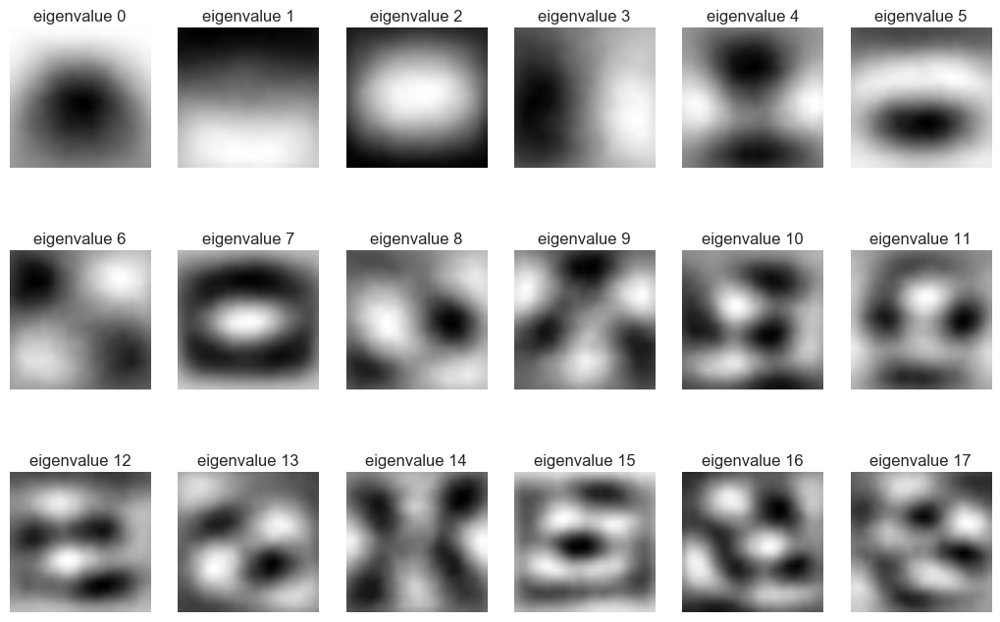

In [19]:
eigenface_titles = ["eigenvalue %d" % i for i in range(eigenfaces.shape[0])]
plot_gallery(eigenfaces, eigenface_titles, h, w)

/Users/danh/anaconda/envs/machinelearning/lib/python3.5/site-packages/sklearn/utils/validation.py:386: DeprecationWarning:

Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.



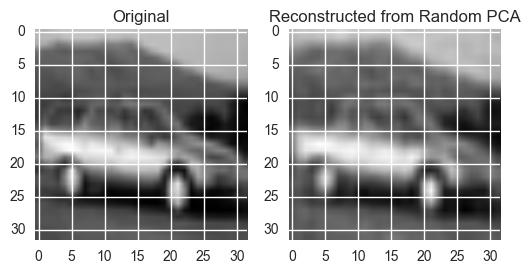

In [20]:
from skimage.io import imshow
# idx_to_reconstruct = int(np.random.rand(1)*len(X))
idx_to_reconstruct = 4
low_dimensional_representation, reconstructed_image = reconstruct_image(rpca,X[idx_to_reconstruct])
plt.subplot(1,2,1)
plt.imshow(X[idx_to_reconstruct].reshape((h, w)), cmap=plt.cm.gray)
plt.title('Original')
plt.subplot(1,2,2)
plt.imshow(reconstructed_image.reshape((h, w)), cmap=plt.cm.gray)
plt.title('Reconstructed from Random PCA')


## Kernel PCA- Nonlinear Reduction

We used kernel principal component analysis to perform a non-linear dimensionality reduction. Upon quick inspection, the automobile reconstructed from kernel PCA appear to match the original picture more closely than the linear reduction methods.  

In [100]:
from sklearn.decomposition import KernelPCA
to 
n_components = 300
print ("Extracting the top %d eigenvalues from %d objects" % (n_components, X.shape[0]))

kpca = KernelPCA(n_components=n_components, kernel='rbf', 
                fit_inverse_transform=True, gamma=15) # very sensitive to the gamma parameter
%time kpca.fit(X)


Extracting the top 300 eigenvalues from 5000 objects
CPU times: user 38.8 s, sys: 1.09 s, total: 39.9 s
Wall time: 23.1 s


KernelPCA(alpha=1.0, coef0=1, degree=3, eigen_solver='auto',
     fit_inverse_transform=True, gamma=15, kernel='rbf',
     kernel_params=None, max_iter=None, n_components=300,
     remove_zero_eig=False, tol=0)

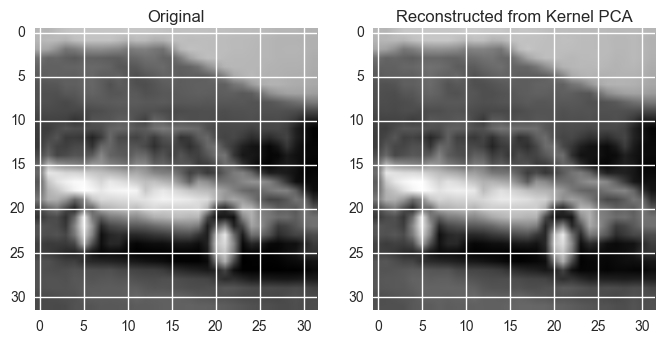

In [101]:
idx_to_reconstruct = 4    
low_dimensional_representation, reconstructed_image = reconstruct_image(kpca,X[idx_to_reconstruct])

plt.subplot(1,2,1)
plt.imshow(X[4].reshape((h, w)), cmap=plt.cm.gray)
plt.title('Original')
plt.subplot(1,2,2)
plt.imshow(reconstructed_image.reshape((h, w)), cmap=plt.cm.gray)
plt.title('Reconstructed from Kernel PCA')

## Linear vs. Non-linear PCA

After comparing the reconstructions from all three PCA's below, the Kernel PCA reconstruction can most accurately reflect the original picture. However, Randomized PCA is not far behind. There are cases where the Kernel PCA reconstruction is not very similar to the original. When that occurs, Kernal PCA appears wrong by a huge margin. Randomized PCA is more frequently similar to the original image. For this reason, we would prefer to use randomized PCA. We would rather be a tiny bit less accurate all the time, than dead wrong several times when trying to reconstruct an image.  

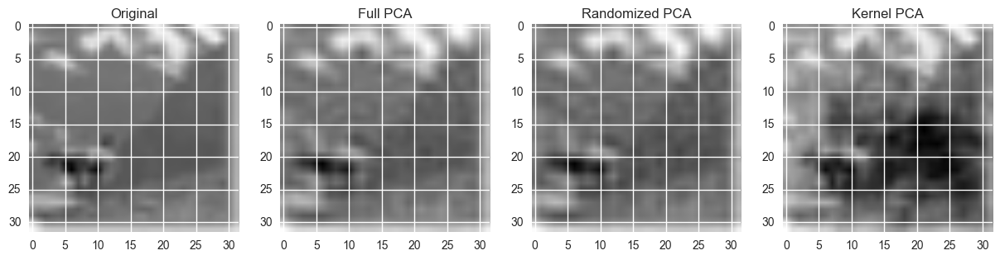

In [105]:
import warnings
warnings.simplefilter('ignore', DeprecationWarning)

from ipywidgets import widgets  # make this interactive!
# compare the different methods

def plt_reconstruct(idx_to_reconstruct):
    idx_to_reconstruct = np.round(idx_to_reconstruct)
    
    reconstructed_image = pca.inverse_transform(pca.transform(X[idx_to_reconstruct]))
    reconstructed_image_rpca = rpca.inverse_transform(rpca.transform(X[idx_to_reconstruct]))
    reconstructed_image_kpca = kpca.inverse_transform(kpca.transform(X[idx_to_reconstruct]))
    
    
    plt.figure(figsize=(15,7))
    
    plt.subplot(1,4,1)
    plt.imshow(X[idx_to_reconstruct].reshape((h, w)), cmap=plt.cm.gray)
    plt.title('Original')
    
    plt.subplot(1,4,2)
    plt.imshow(reconstructed_image.reshape((h, w)), cmap=plt.cm.gray)
    plt.title('Full PCA')
    
    plt.subplot(1,4,3)
    plt.imshow(reconstructed_image_rpca.reshape((h, w)), cmap=plt.cm.gray)
    plt.title('Randomized PCA')
    
    plt.subplot(1,4,4)
    plt.imshow(reconstructed_image_kpca.reshape((h, w)), cmap=plt.cm.gray)
    plt.title('Kernel PCA')
    
widgets.interact(plt_reconstruct,idx_to_reconstruct=(0,n_samples-1,1),__manual=True)

## Daisy Feature Extraction 

In order to test out feature extraction, we first applied the DAISY descriptor to the images. The first image below illustrates how the descriptor will be applied onto our 32 x 32 image. 

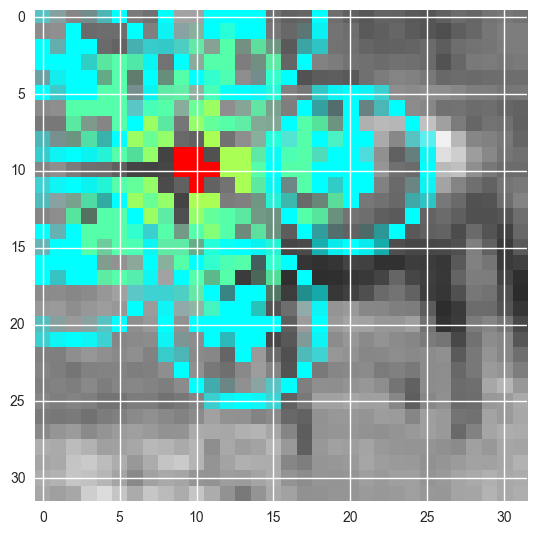

In [93]:
from skimage.feature import daisy

# lets first visualize what the daisy descriptor looks like
features, img_desc = daisy(img,step=40, radius=10, rings=3, histograms=5, orientations=8, visualize=True)
imshow(img_desc)

In [94]:
features = daisy(img,step=10, radius=10, rings=2, histograms=4, orientations=8, visualize=False)
print(features.shape)
print(features.shape[0]*features.shape[1]*features.shape[2])

(2, 2, 72)
288


In [65]:
# create a function to tak in the row of the matric and return a new feature
def apply_daisy(row,shape):
    feat = daisy(row.reshape(shape),step=10, radius=10, rings=2, histograms=6, orientations=8, visualize=False)
    return feat.reshape((-1))

%time test_feature = apply_daisy(X[3],(h,w))
test_feature.shape

CPU times: user 6.69 ms, sys: 1.24 ms, total: 7.93 ms
Wall time: 19.4 ms


(416,)

In [68]:
# apply to entire data, row by row,
# takes about a minute to run
%time daisy_features = np.apply_along_axis(apply_daisy, 1, X, (h,w))
print(daisy_features.shape)

CPU times: user 18.7 s, sys: 591 ms, total: 19.3 s
Wall time: 24.9 s
(5000, 416)


In [69]:
from sklearn.metrics.pairwise import pairwise_distances
# find the pairwise distance between all the different image features
%time dist_matrix = pairwise_distances(daisy_features,n_jobs=-1)

CPU times: user 849 ms, sys: 9.26 s, total: 10.1 s
Wall time: 11.6 s


After applying the DAISY descriptor to all images in the dataset, we wanted a quick visualization of whether or not DAISY would find objects of the same class. The filter does indeed closely pair two images of an automobile. While the second image is less clear, the pair does seem to have similar size and angle.

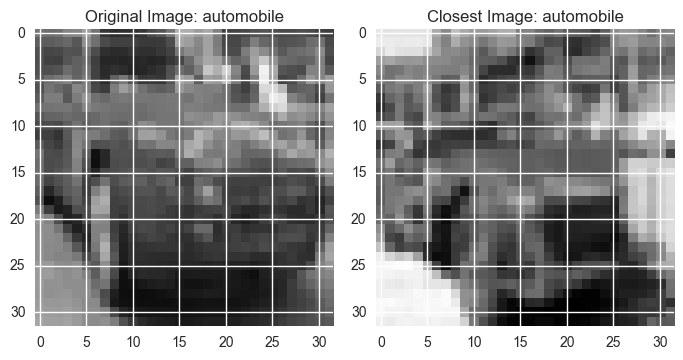

In [70]:
import copy
# find closest image to current image
idx1 = 5
distances = copy.deepcopy(dist_matrix[idx1,:])
distances[idx1] = np.infty # dont pick the same image!
idx2 = np.argmin(distances)

plt.figure(figsize=(7,10))
plt.subplot(1,2,1)
imshow(X[idx1].reshape((h,w)))
plt.title("Original Image: "+names[idx1])

plt.subplot(1,2,2)
imshow(X[idx2].reshape((h,w)))
plt.title("Closest Image: "+names[idx1])

When extending our inspection to three images, DAISY operator alone does not do as well. For the image below (image 827) matches two birds of similar shapes and angle, but its third closest match appears to be a fighter jet, though one that is also a similar shape to the two birds. 

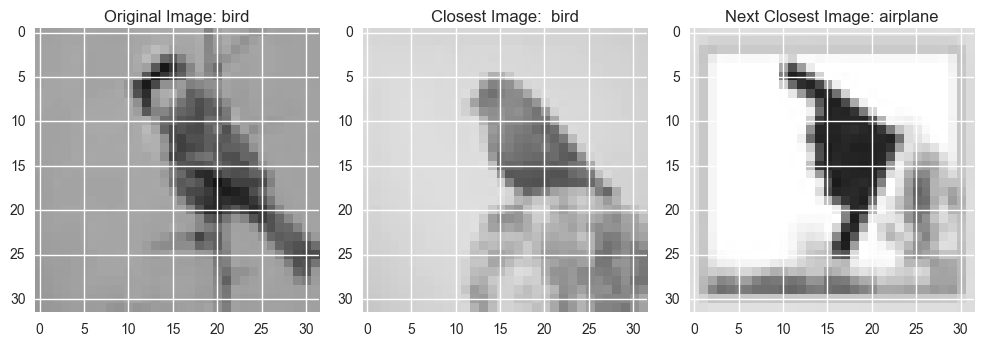

In [71]:
from ipywidgets import fixed
from ipywidgets import widgets
# put it together inside a nice widget
def closest_image(dmat,idx1):
    distances = copy.deepcopy(dmat[idx1,:]) # get all image diatances
    distances[idx1] = np.infty # dont pick the same image!
    idx2 = np.argmin(distances)
    
    distances[idx2] = np.infty
    idx3 = np.argmin(distances)
    
    plt.figure(figsize=(10,16))
    plt.subplot(1,3,1)
    imshow(X[idx1].reshape((h,w)))
    plt.title("Original Image: "+names[idx1])

    plt.subplot(1,3,2)
    imshow(X[idx2].reshape((h,w)))
    plt.title("Closest Image:  "+names[idx2])
    
    plt.subplot(1,3,3)
    imshow(X[idx3].reshape((h,w)))
    plt.title("Next Closest Image: "+names[idx3])
    
widgets.interact(closest_image,idx1=(0,n_samples-1,1),dmat=fixed(dist_matrix),__manual=True)

## Gabor Feature Extraction

We perform another feature extraction using Gabor filters, which are used to detect textures and edges. By getting the Gabor feature set for each image in the data set, we can compare the distance matrices to one another in order to fine the next closest image. This can be useful to see if using Gabor features will be a good way to recognize objects of the same class.

In [72]:
from skimage.filters import gabor_kernel
from scipy import ndimage as ndi
from scipy import stats

# prepare filter bank kernels
kernels = []
for theta in range(4):
    theta = theta / 4. * np.pi
    for sigma in (1, 3):
        for frequency in (0.05, 0.25):
            kernel = np.real(gabor_kernel(frequency, theta=theta,
                                          sigma_x=sigma, sigma_y=sigma))
            kernels.append(kernel)

            
# compute the filter bank and take statistics of image
def compute_gabor(row, kernels, shape):
    feats = np.zeros((len(kernels), 4), dtype=np.double)
    for k, kernel in enumerate(kernels):
        filtered = ndi.convolve(row.reshape(shape), kernel, mode='wrap')
        _,_,feats[k,0],feats[k,1],feats[k,2],feats[k,3] = stats.describe(filtered.reshape(-1))
        # mean, var, skew, kurt
        
    return feats.reshape(-1)

idx_to_reconstruct = int(np.random.rand(1)*len(X))

gabr_feature = compute_gabor(X[idx_to_reconstruct], kernels, (h,w))
gabr_feature

array([  4.10477276e-01,   4.59642464e-02,  -2.23732117e-01,
        -1.31702139e+00,   1.25485120e-01,   4.57980438e-03,
        -2.38119663e-01,  -1.29420983e+00,   2.76894754e-01,
         1.47162931e-02,  -1.82586130e-01,  -1.21692810e+00,
         4.13024274e-04,   3.52808800e-05,  -1.27577365e-02,
         1.08995876e+00,   4.10480918e-01,   4.60860697e-02,
        -2.23818153e-01,  -1.31868452e+00,   1.25660923e-01,
         4.91327725e-03,  -2.50960869e-01,  -1.33882118e+00,
         2.79292664e-01,   1.68968983e-02,  -1.76826340e-01,
        -1.27613594e+00,   6.65228879e-05,   1.30544580e-05,
        -6.35546491e-04,   3.21623139e+00,   4.10477276e-01,
         4.61803781e-02,  -2.23120981e-01,  -1.32082661e+00,
         1.25485120e-01,   5.39658062e-03,  -2.22379917e-01,
        -1.37961881e+00,   2.76894754e-01,   1.88665151e-02,
        -1.56950670e-01,  -1.34772691e+00,   4.13024274e-04,
         1.70538247e-04,  -2.60181506e-02,  -7.65243027e-01,
         4.10480918e-01,

In [74]:
# takes ~3 minutes to run entire dataset
%time gabor_stats = np.apply_along_axis(compute_gabor, 1, X, kernels, (h,w))
print(gabor_stats.shape)

CPU times: user 1min 57s, sys: 1.31 s, total: 1min 58s
Wall time: 2min 5s
(5000, 64)


In [75]:
from sklearn.metrics.pairwise import pairwise_distances
# find the pairwise distance between all the different image features
%time dist_matrix = pairwise_distances(gabor_stats,n_jobs=-1)

CPU times: user 826 ms, sys: 11.5 s, total: 12.3 s
Wall time: 14.2 s


Using Gabor features, we tested out the closest match of an automobile, and it does indeed return an image of an automobile. In fact, we could not even tell the second black and white image was an automobile without the label. 

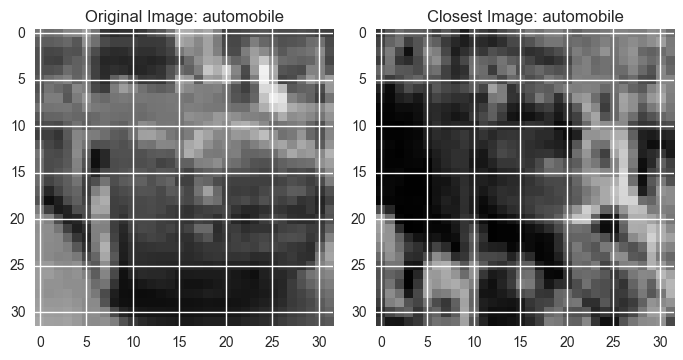

In [77]:
# find closest image to current image
idx1 = 5
distances = copy.deepcopy(dist_matrix[idx1,:])
distances[idx1] = np.infty # dont pick the same image!
idx2 = np.argmin(distances)

plt.figure(figsize=(7,10))
plt.subplot(1,2,1)
imshow(X[idx1].reshape((h,w)))
plt.title("Original Image: "+names[idx1])

plt.subplot(1,2,2)
imshow(X[idx2].reshape((h,w)))
plt.title("Closest Image: "+names[idx1])

In the example below (image 827), we can see that the next closest image is indeed a bird (the same class as the original), but the next is an airplane. Tiny photos of birds and airplanes may be very similar because of their shapes, edges, and the fact that they are likely to have similar white space in the background. Comparing the same image search using the DAISY descriptor, the "bird" matches here have similar shape but different orientations. For many different original images, we are able to get the closest, and next closest images to match, however we are no where near above 50% in computing this. 

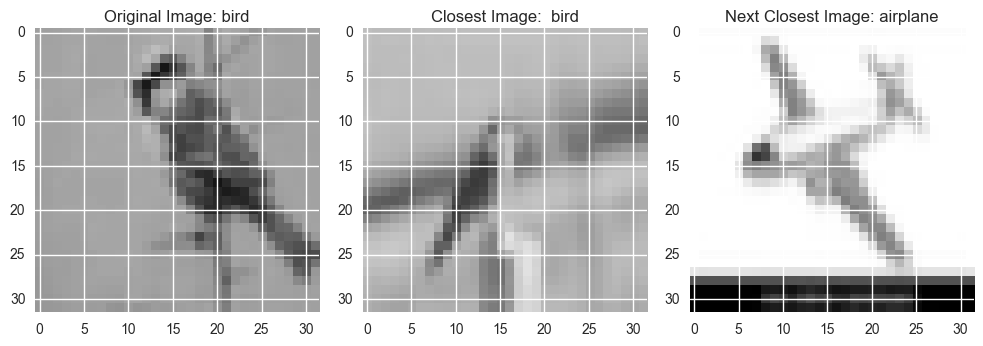

In [76]:
widgets.interact(closest_image,idx1=(0,n_samples-1,1),dmat=fixed(dist_matrix),__manual=True)

## Comparing Gabor Features

We decided to proceed our analysis of Gabor features, as we attempt to see if there are distinct differences among the different classes

In [37]:
cols = np.arange(0, 66, 1)
col_vector = np.array(names)
# create column vector and add it to matrix with label
cols_test = np.column_stack((col_vector,col_vector))
gabor = np.hstack((gabor_stats, cols_test))
df = pd.DataFrame(gabor, columns=cols)
df.head()

,0,1,2,3,4,5,6,7,8,9,...,56,57,58,59,60,61,62,63,64,65
0,0.414985,0.0151873,0.997814,1.33958,0.126863,0.0022937,0.901147,1.51329,0.279936,0.0033493,...,0.28236,0.00369319,0.988361,0.771068,6.72534e-05,4.94922e-05,0.00646399,0.240914,frog,frog
1,0.486309,0.0311803,0.266083,-0.726545,0.148667,0.0043284,0.222907,-0.751098,0.328048,0.006347,...,0.330889,0.0077034,-0.0312266,-0.951356,7.88123e-05,7.97332e-05,0.0455811,-0.0215064,truck,truck
2,0.501356,0.0796952,0.506289,-1.30794,0.153267,0.00847415,0.454683,-1.33252,0.338198,0.023858,...,0.341127,0.0274241,0.467073,-1.19327,8.12509e-05,0.000130121,0.0302848,2.26077,truck,truck
3,0.318379,0.0103046,1.80502,3.89084,0.0973301,0.00138853,1.46852,3.05466,0.214768,0.0024342,...,0.216628,0.0025535,1.53392,2.27188,5.15972e-05,1.86769e-05,0.0422627,1.37379,deer,deer
4,0.376304,0.0309635,0.413068,-0.368363,0.115038,0.00380832,0.298167,-0.21173,0.253843,0.00474758,...,0.256041,0.00671076,0.38166,-0.585259,6.09848e-05,9.77567e-05,-0.026744,3.88174,automobile,automobile


The plot below is a comparison of the top 5 gabor features for all 10 classes within this data set. It is hard to distinguish the difference between all of them. There is a slight different in spread among some classes, but most have similar distributions. Gabor feature extraction alone may not be the best way to filter the images in this data set. Further below, we will examine the plots with only 2 classes at a time to see if there is a more noticable difference among the plots. 

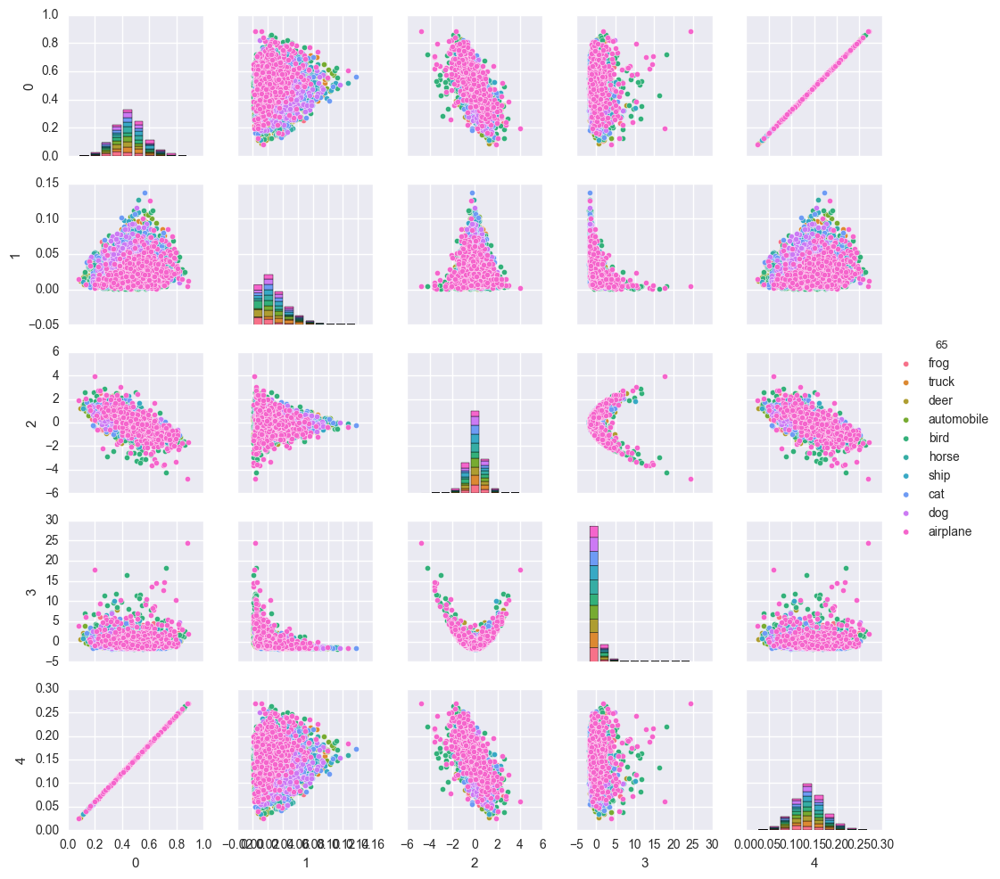

In [38]:
%matplotlib inline
from matplotlib import pyplot as plt
import seaborn as sns

deleted_cols = np.arange(5,65,1)

#only use the top 5 gabor values in feature pair plots
df.drop(df.columns[deleted_cols], axis=1, inplace=True)
df.head()
sns.set()
sns.pairplot(df,hue=65, size=2)

Below is the heat map of the gabor feature correlations. This is only depicting the top 5 Gabor features but if we were to expand this, the heat map starts to repeat and become a checkered pattern. Since Gabor filters are applied at different orientations, this create a repeating pattern of highly correlated, and conversely, negatively correlated features. 

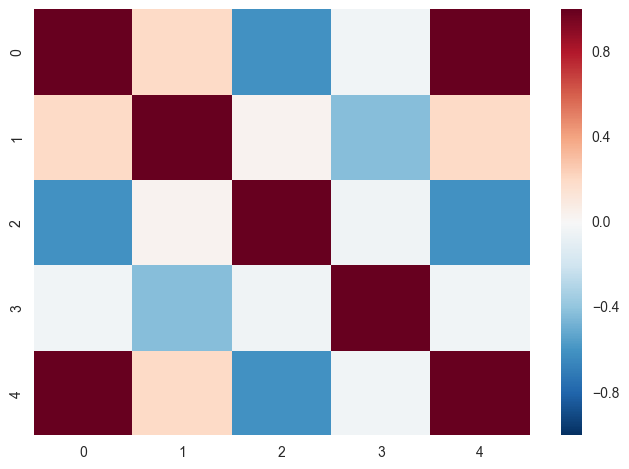

In [39]:
cols = np.arange(0,64,1)
df_no_labels = pd.DataFrame(gabor_stats, columns=cols)
deleted_cols = np.arange(5,64,1)

#only use the top 5 gabor values in feature pair plots
df_no_labels.drop(df_no_labels.columns[deleted_cols], axis=1, inplace=True)
sns.heatmap(df_no_labels.corr())

We decided to examine the classes two at a time. The plot below is a comparison of the top 5 gabor features for a truck and a bird determined during feature extraction. We can see that the distribution of features for trucks are closer together, whereas the one for birds  are more varied.

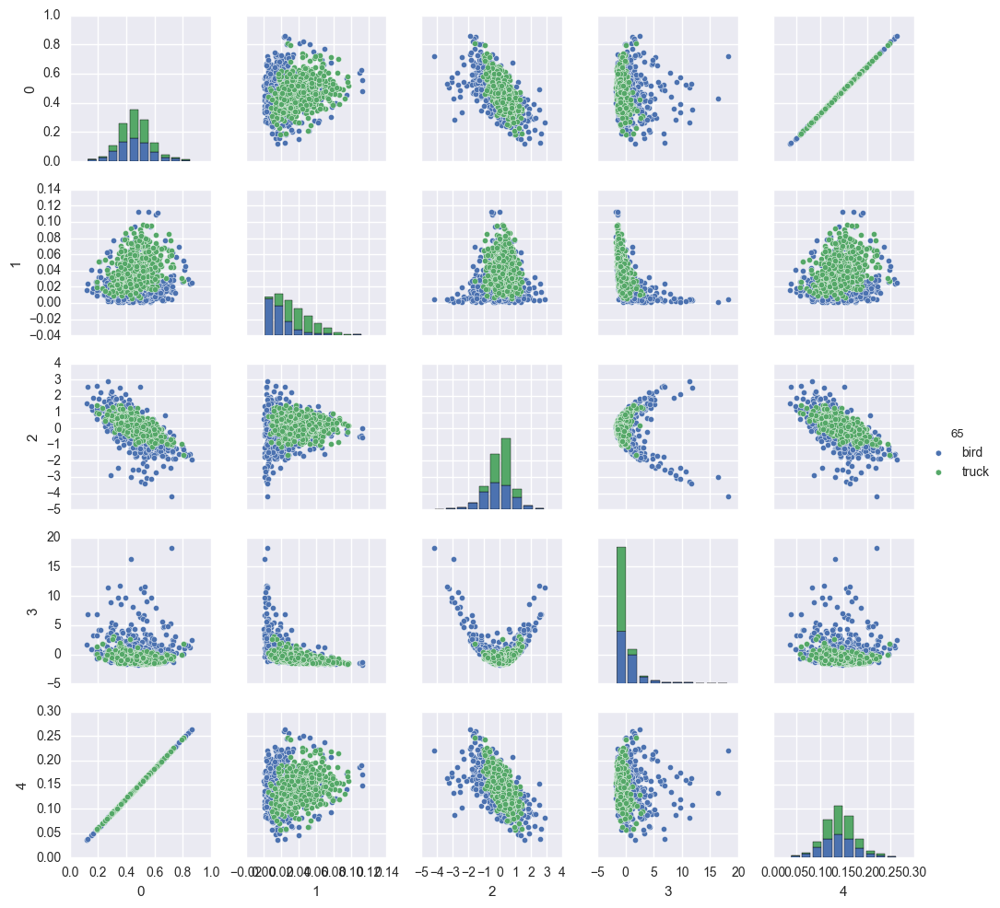

In [40]:
df_copy = df.copy()
df_truck = df_copy[df_copy[65] == 'truck']

df_copy = df.copy()
df_frog = df_copy[df_copy[65] == 'bird']
bigdata = df_frog.append(df_truck, ignore_index=True)

sns.set()
sns.pairplot(bigdata,hue=65, size=2)

We then compared the distributions of Gabor filters between cat images and ship images. There is more overlap between the distributions compared to birds vs trucks. Differentiating between cat pictures and ship pictures may be difficult with just Gabor filters alone.

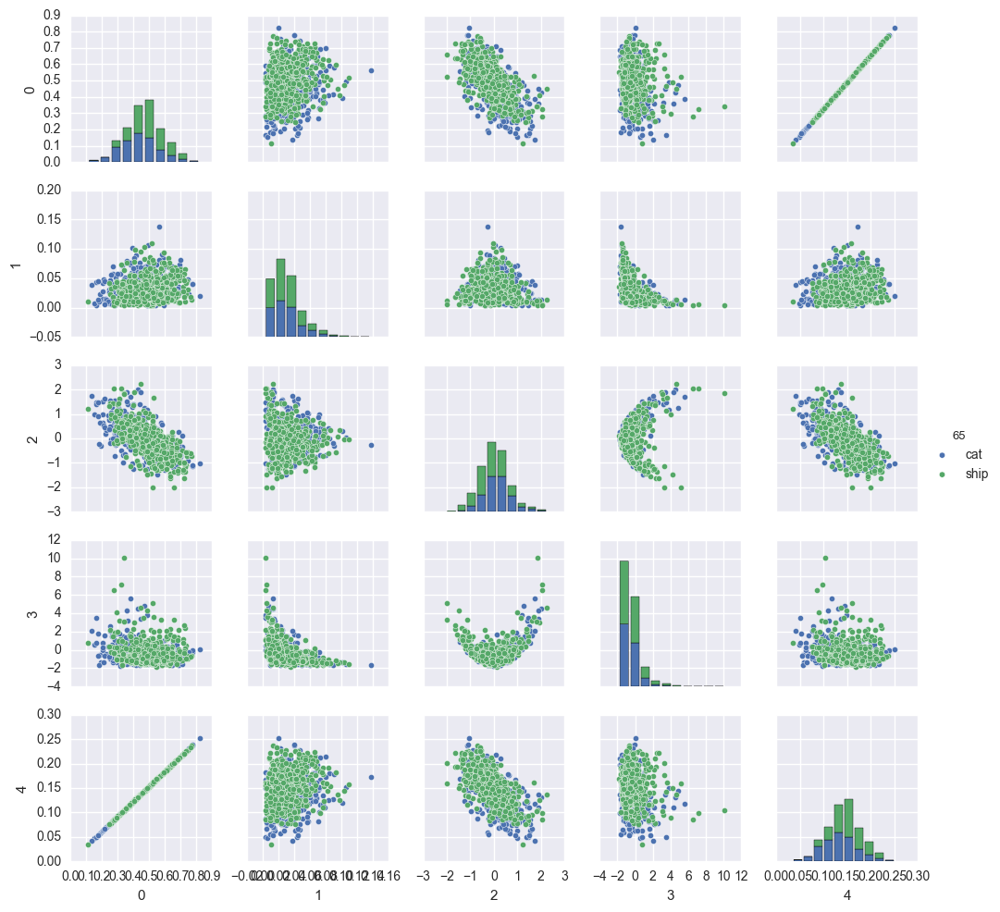

In [41]:
df_copy = df.copy()
df_truck = df_copy[df_copy[65] == 'ship']

df_copy = df.copy()
df_frog = df_copy[df_copy[65] == 'cat']
bigdata = df_frog.append(df_truck, ignore_index=True)

sns.set()
sns.pairplot(bigdata,hue=65, size=2)

In [96]:
def biplot(pca, dat, title=''):
    
    import plotly
    from plotly.graph_objs import Scatter, Marker, Layout, XAxis, YAxis, Bar, Line
    plotly.offline.init_notebook_mode() # run at the start of every notebook
    
    # 0,1 denote PC1 and PC2; change values for other PCs
    xvector = pca.components_[0] 
    yvector = pca.components_[1]

    tmp = pca.transform(dat.values)
    xs = tmp[:,0] 
    ys = tmp[:,1]

    annotations = [Scatter(x=xs, y=ys, mode ='markers', name='cumulative explained variance')]
    for i in range(len(xvector)):
        txt = list(dat.columns.values)[i]
        annotations.append(
                Scatter(
                    x=[0, xvector[i]*max(xs)],
                    y=[0, yvector[i]*max(ys)],
                    mode='lines+text',
                    text=['', txt],
                    name=txt,
                ))
    
    plotly.offline.iplot({
        "data": annotations,
        "layout": Layout(xaxis=XAxis(title='Principal Component One'), 
                         yaxis=YAxis(title='Principal Component Two'),
                        title=title)
    })


    plt.show()
    
X2 = gabor_stats
pca = PCA(n_components=4)
pca.fit(X2) 
columns = np.arange(0,64,1)

biplot(pca,pd.DataFrame(gabor_stats,columns=columns),'Gabor Feature Biplot')


Below is a graph of the explained variance ratio when using the gabor features as the principle components. Here we can see that we would just need 6 gabor features in order to see a variance ratio above 0.96. This is conciderably better than what we had before by just examining the variance pixel by pixel of the image. By using the pixels as the principle components, we would need around 100 pixels/features in order to see a 0.92 ratio or better. 

![Gabor](https://raw.githubusercontent.com/egabrielsen/MachineLearning/master/Lab03/Screen%20Shot%202017-02-17%20at%209.10.51%20PM.png)

In [44]:
pca = PCA(n_components=64)
X_pca = pca.fit(gabor_stats)
plot_explained_variance(pca)